<a href="https://colab.research.google.com/github/PoussyAyman/DSAI103/blob/main/DSAI103_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
#step 1

capture = cv2.VideoCapture('/content/DataExample.mp4')

In [ ]:
# step 2

frames_total = []
frame_count = 0
total_frames = 1700

while frame_count < total_frames:
    ret, frame = capture.read()

    if not ret:
        break

    if frame_count < 10:
        frames_total.append(frame)
        cv2.imwrite(f'frame_first_{len(frames_total)}.jpg', frame)
    elif frame_count >= total_frames - 10:
        frames_total.append(frame)
        cv2.imwrite(f'frame_last_{len(frames_total)}.jpg', frame)
    elif frame_count >= (total_frames // 2) - 5 and frame_count < (total_frames // 2) + 5:
        frames_total.append(frame)
        cv2.imwrite(f'frame_middle_{len(frames_total)}.jpg', frame)

    frame_count += 1

total_frames = len(frames_total)


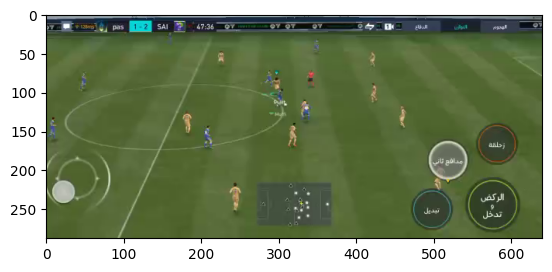

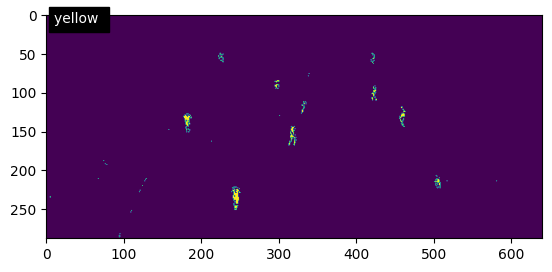

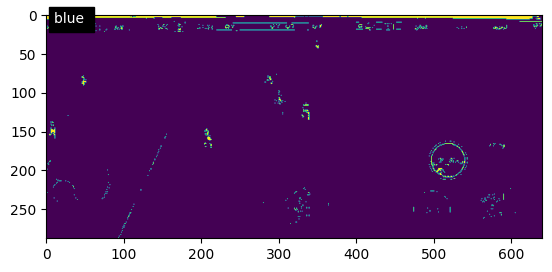

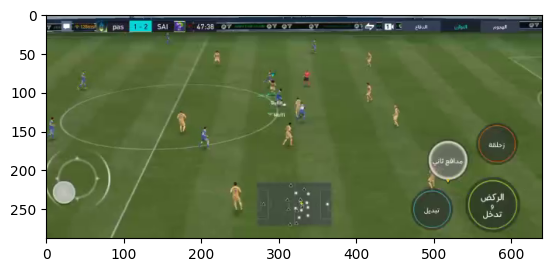

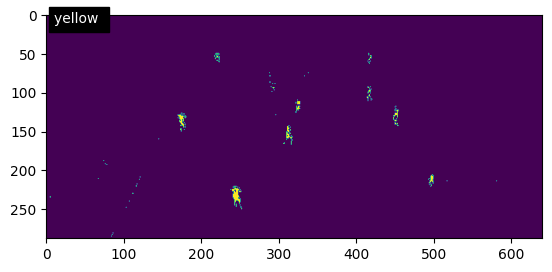

...

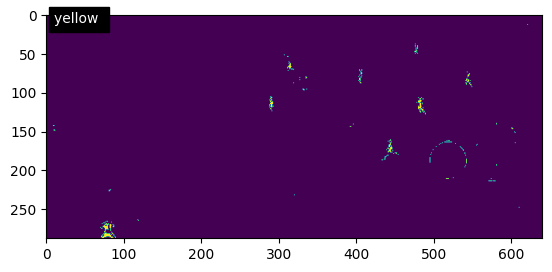

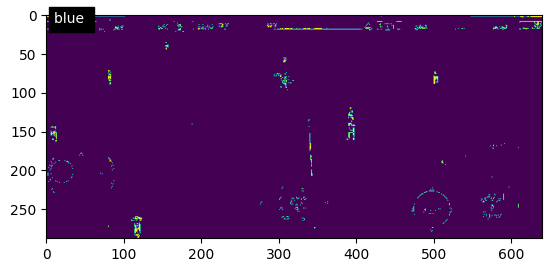

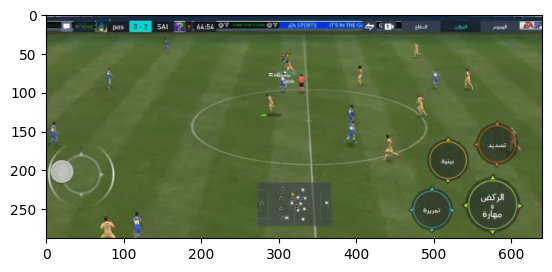

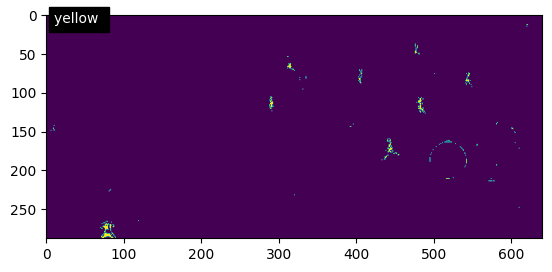

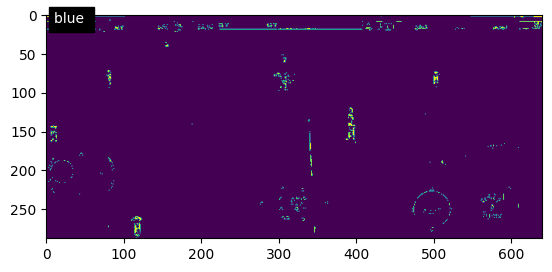

In [ ]:
#step 3

for frame in frames_total:
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.show()
    # Yellow
    lower_yellow = np.array([146,112,58])
    upper_yellow = np.array([206,172,118])
    mask_yellow = cv2.inRange(image, lower_yellow, upper_yellow)
    plt.imshow(mask_yellow)
    plt.text(10, 10, 'yellow ', color='white', backgroundcolor='black')
    plt.show()

    # Blue
    lower_blue = np.array([64, 80, 119])
    upper_blue = np.array([162, 170, 180])
    mask_blue = cv2.inRange(image, lower_blue, upper_blue)
    plt.imshow(mask_blue)
    plt.text(10, 10, 'blue ', color='white', backgroundcolor='black')
    plt.show()



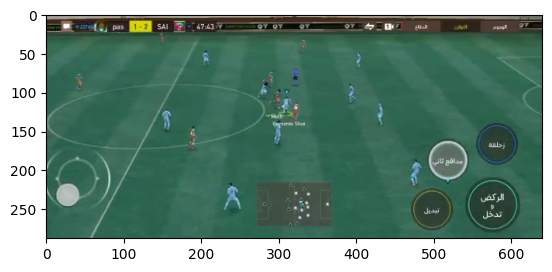

Overall Position: Right


In [ ]:
#STEP 4:REGION

def determine_positions(points):
    num_points = len(points)
    positions = ['Unknown'] * num_points

    for i in range(num_points):
        P = points[i][0]
        vec_sum = np.zeros(2)
        for j in range(num_points):
            if i != j:
                q = points[j][0]
                vec = q - P
                vec_sum += vec

        if vec_sum[0] < 0:
            positions[i] = 'Left'
        elif vec_sum[0] > 0:
            positions[i] = 'Right'
        else:
            positions[i] = 'Middle'

    return positions


def process_frame(frame):
    image = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)


    lower_white = np.array([0, 0, 168])
    upper_white = np.array([172, 255, 255])
    mask_white = cv2.inRange(image, lower_white, upper_white)


    points = []
    for i in range(mask_white.shape[0]):
        for j in range(mask_white.shape[1]):
            if mask_white[i, j] > 0:
                points.append((j, i))


    positions = determine_positions(points)


    left_count = 0
    right_count = 0
    middle_count = 0
    for i in range(len(points)):
        point = points[i]
        position = positions[i]
        if position == 'Left':
            left_count += 1
        elif position == 'Right':
            right_count += 1
        elif position == 'Middle':
            middle_count += 1

    if left_count > right_count and left_count > middle_count:
        overall_position = 'Left'
    elif right_count > left_count and right_count > middle_count:
        overall_position = 'Right'
    else:
        overall_position = 'Middle'


    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    plt.show()

    return overall_position



frame = cv2.imread('/content/frame_first_6.jpg')


overall_position = process_frame(frame)

print("Overall Position:", overall_position)


In [ ]:
#STEP 5:BALL POSITION

def detect_ball(frame):

    hsv_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    ball_boundraries = (
        np.array([0, 0, 200]),
        np.array([180, 50, 255])
    )

    ball_pixels = []
    for y in range(frame.shape[0]):
        for x in range(frame.shape[1]):

            FramePixels = hsv_frame[y, x]

            if ball_boundraries[0][0] <=  FramePixels[0] <= ball_boundraries[1][0] and ball_boundraries[0][1] <=  FramePixels[1] <= ball_boundraries[1][1] and ball_boundraries[0][2] <=  FramePixels[2] <= ball_boundraries[1][2]:
                ball_pixels.append((x, y))

    #  centroid
    sum_x = 0
    sum_y = 0
    ball_x = 0
    ball_y = 0
    if len(ball_pixels) > 0:
        for i in range(len(ball_pixels)):
            sum_x += ball_pixels[i][0]
            sum_y += ball_pixels[i][1]
        ball_x = sum_x / len(ball_pixels)
        ball_y = sum_y / len(ball_pixels)

        #   location
        frame_width = frame.shape[1]
        if ball_x < frame_width / 3:
            ball_side = "Left"
        elif ball_x > (2 * frame_width) / 3:
            ball_side = "Right"
        else:
            ball_side = "Middle"

        width = frame.shape[1]
        height = frame.shape[0]

        mask = np.zeros((height, width), dtype=np.uint8)

        for i in ball_pixels:

            x, y = i
            mask[y, x] = 255

        ball_image = np.zeros(frame.shape, np.uint8)
        for x in range(frame.shape[0]):
            for y in range(frame.shape[1]):
                if mask[x, y] != 0:
                    ball_image[x, y] = frame[x, y]
    else:
        ball_side = "can not detect"
        ball_image = frame

    return ball_image, ball_side


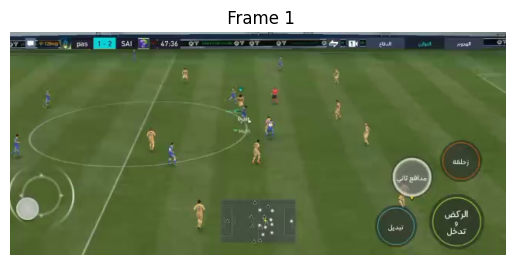

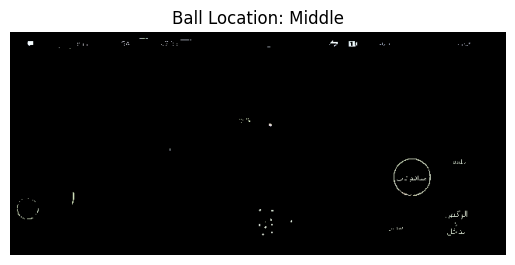

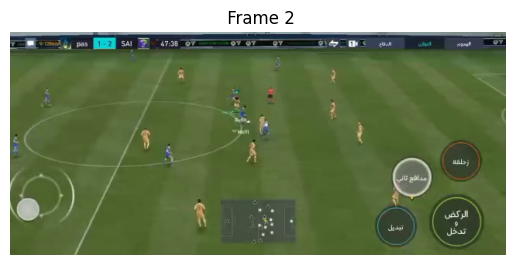

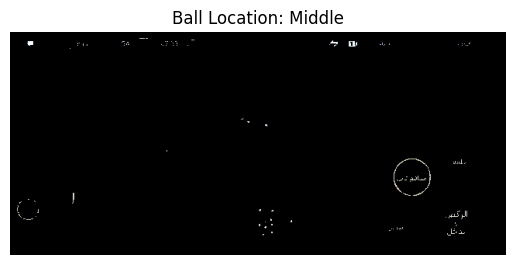

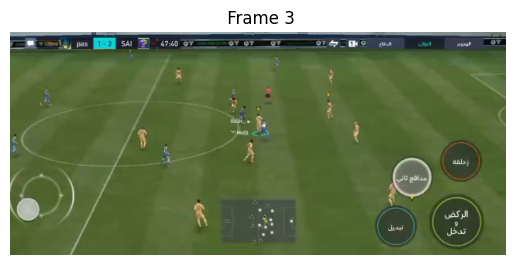

...

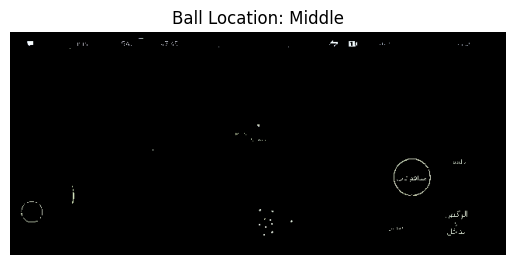

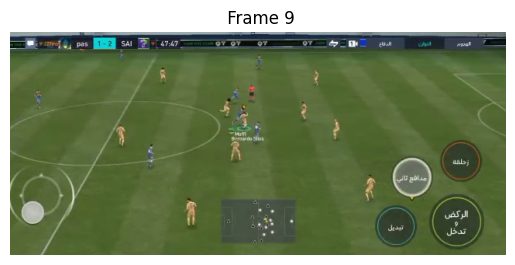

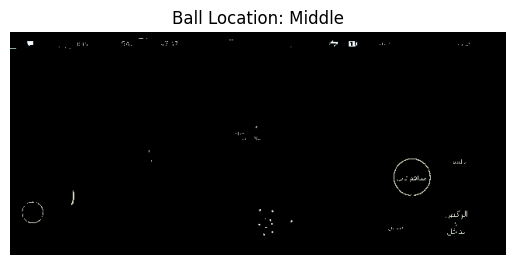

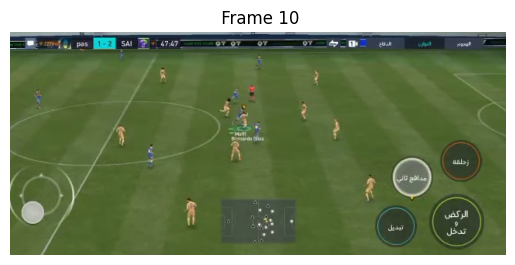

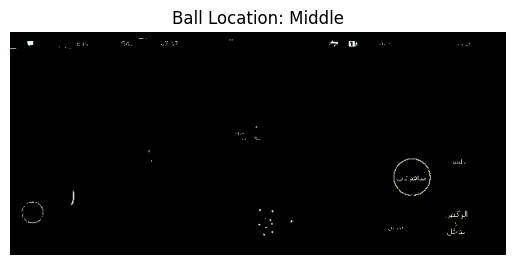

In [ ]:
for i in range(0, 10):
    frame_path = f'frame_first_{i+1}.jpg'
    frame = cv2.imread(frame_path)

    ball_image, ball_side = detect_ball(frame)

    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f' Frame {i+1}')
    plt.show()

    plt.imshow(cv2.cvtColor(ball_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f'Ball Location: {ball_side}')
    plt.show()


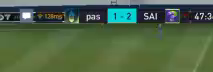

Blue Players: 5
Yellow Players: 0
---


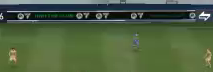

Blue Players: 1
Yellow Players: 0
---


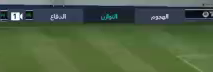

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


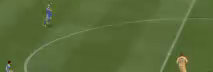

Blue Players: 1
Yellow Players: 0
---


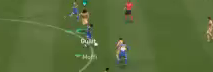

Blue Players: 3
Yellow Players: 1
---


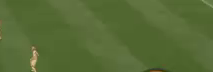

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


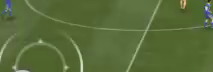

Blue Players: 2
Yellow Players: 0
---


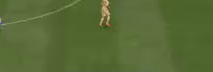

Blue Players: 0
Yellow Players: 0
---


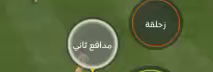

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


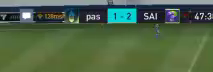

Blue Players: 5
Yellow Players: 0
---


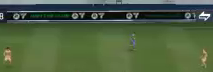

Blue Players: 1
Yellow Players: 0
---


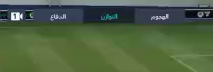

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


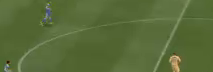

Blue Players: 1
Yellow Players: 0
---


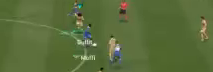

Blue Players: 2
Yellow Players: 0
---


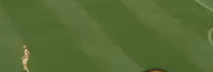

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


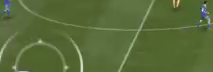

Blue Players: 2
Yellow Players: 0
---


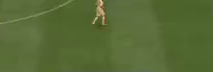

Blue Players: 0
Yellow Players: 0
---


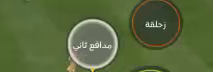

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


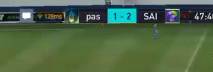

Blue Players: 5
Yellow Players: 1
---


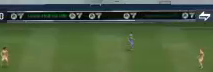

Blue Players: 1
Yellow Players: 0
---


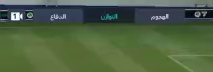

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


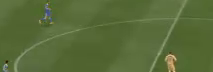

Blue Players: 1
Yellow Players: 0
---


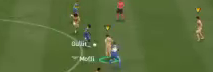

Blue Players: 2
Yellow Players: 0
---


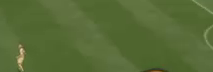

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


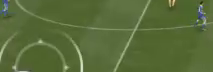

Blue Players: 2
Yellow Players: 0
---


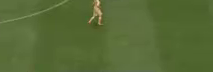

Blue Players: 0
Yellow Players: 0
---


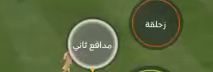

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


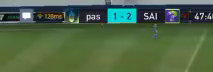

Blue Players: 5
Yellow Players: 1
---


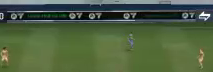

Blue Players: 1
Yellow Players: 0
---


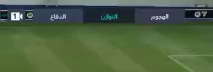

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


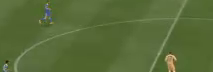

Blue Players: 1
Yellow Players: 0
---


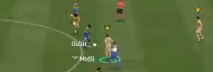

Blue Players: 3
Yellow Players: 0
---


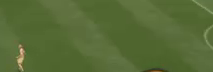

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


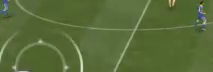

Blue Players: 2
Yellow Players: 0
---


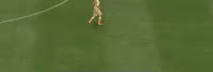

Blue Players: 0
Yellow Players: 0
---


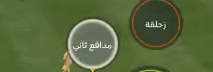

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


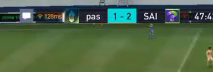

Blue Players: 3
Yellow Players: 1
---


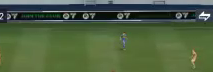

Blue Players: 1
Yellow Players: 0
---


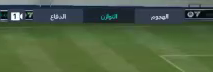

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


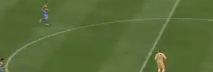

Blue Players: 2
Yellow Players: 0
---


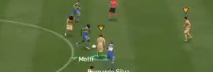

Blue Players: 3
Yellow Players: 0
---


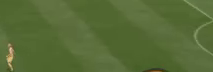

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


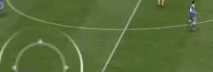

Blue Players: 2
Yellow Players: 0
---


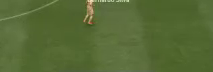

Blue Players: 0
Yellow Players: 0
---


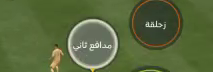

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


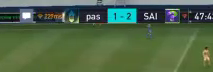

Blue Players: 3
Yellow Players: 1
---


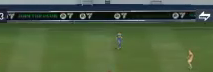

Blue Players: 1
Yellow Players: 0
---


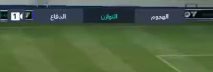

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


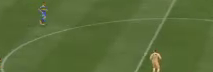

Blue Players: 1
Yellow Players: 0
---


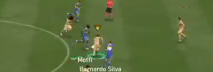

Blue Players: 2
Yellow Players: 0
---


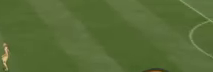

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


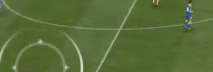

Blue Players: 1
Yellow Players: 0
---


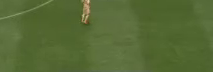

Blue Players: 0
Yellow Players: 0
---


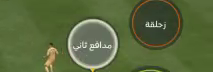

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


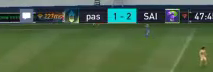

Blue Players: 3
Yellow Players: 2
---


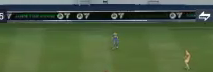

Blue Players: 2
Yellow Players: 0
---


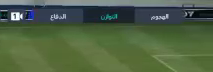

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


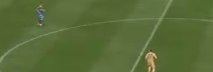

Blue Players: 1
Yellow Players: 0
---


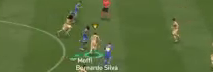

Blue Players: 3
Yellow Players: 0
---


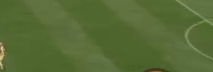

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


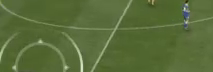

Blue Players: 1
Yellow Players: 0
---


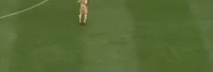

Blue Players: 0
Yellow Players: 0
---


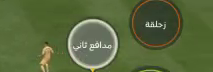

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


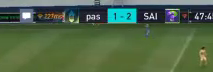

Blue Players: 3
Yellow Players: 2
---


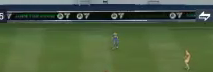

Blue Players: 2
Yellow Players: 0
---


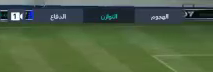

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


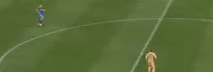

Blue Players: 1
Yellow Players: 0
---


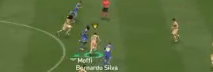

Blue Players: 3
Yellow Players: 0
---


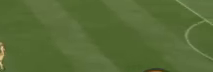

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


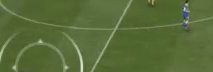

Blue Players: 1
Yellow Players: 0
---


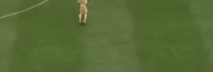

Blue Players: 0
Yellow Players: 0
---


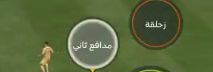

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


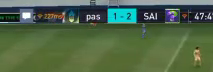

Blue Players: 2
Yellow Players: 2
---


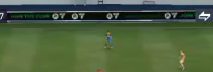

Blue Players: 1
Yellow Players: 0
---


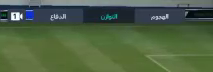

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


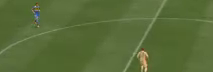

Blue Players: 1
Yellow Players: 0
---


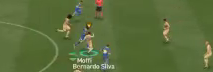

Blue Players: 3
Yellow Players: 0
---


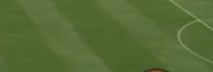

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


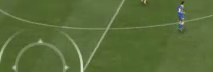

Blue Players: 2
Yellow Players: 0
---


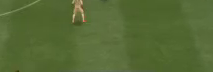

Blue Players: 0
Yellow Players: 0
---


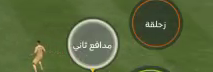

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


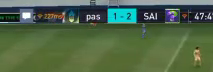

Blue Players: 2
Yellow Players: 2
---


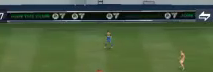

Blue Players: 1
Yellow Players: 0
---


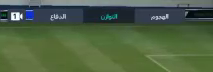

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


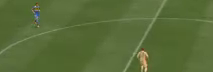

Blue Players: 1
Yellow Players: 0
---


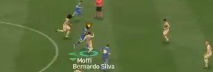

Blue Players: 3
Yellow Players: 0
---


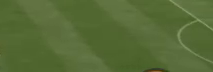

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


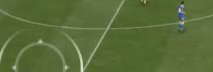

Blue Players: 2
Yellow Players: 0
---


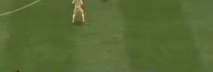

Blue Players: 0
Yellow Players: 0
---


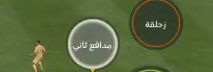

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


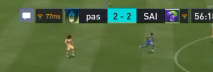

Blue Players: 3
Yellow Players: 0
---


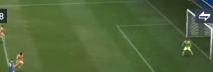

Blue Players: 2
Yellow Players: 0
---


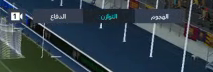

Blue Players: 5
Yellow Players: 2
---


Blue Players: 0
Yellow Players: 0
---


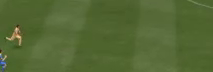

Blue Players: 1
Yellow Players: 0
---


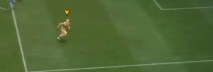

Blue Players: 0
Yellow Players: 0
---


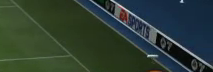

Blue Players: 2
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


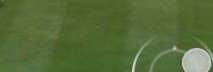

Blue Players: 0
Yellow Players: 0
---


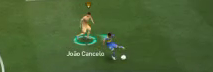

Blue Players: 1
Yellow Players: 0
---


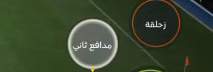

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


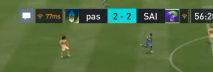

Blue Players: 3
Yellow Players: 0
---


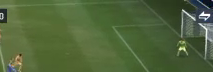

Blue Players: 1
Yellow Players: 0
---


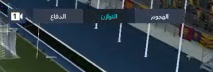

Blue Players: 3
Yellow Players: 2
---


Blue Players: 0
Yellow Players: 0
---


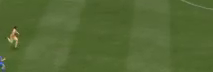

Blue Players: 1
Yellow Players: 0
---


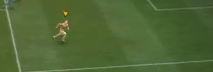

Blue Players: 0
Yellow Players: 0
---


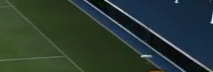

Blue Players: 3
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


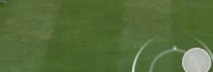

Blue Players: 0
Yellow Players: 0
---


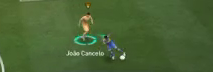

Blue Players: 1
Yellow Players: 0
---


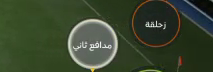

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


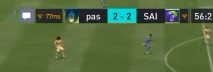

Blue Players: 2
Yellow Players: 0
---


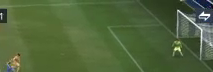

Blue Players: 2
Yellow Players: 0
---


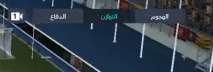

Blue Players: 7
Yellow Players: 2
---


Blue Players: 0
Yellow Players: 0
---


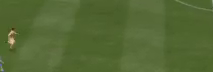

Blue Players: 0
Yellow Players: 0
---


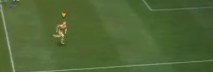

Blue Players: 0
Yellow Players: 0
---


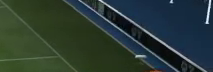

Blue Players: 3
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


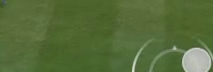

Blue Players: 0
Yellow Players: 0
---


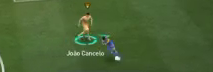

Blue Players: 1
Yellow Players: 0
---


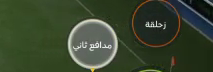

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


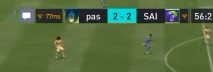

Blue Players: 2
Yellow Players: 0
---


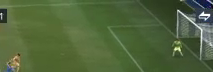

Blue Players: 2
Yellow Players: 0
---


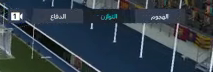

Blue Players: 7
Yellow Players: 2
---


Blue Players: 0
Yellow Players: 0
---


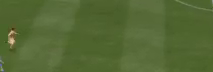

Blue Players: 0
Yellow Players: 0
---


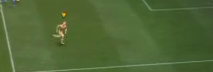

Blue Players: 0
Yellow Players: 0
---


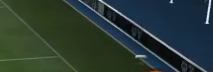

Blue Players: 3
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


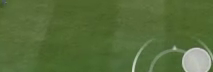

Blue Players: 0
Yellow Players: 0
---


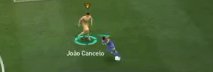

Blue Players: 1
Yellow Players: 0
---


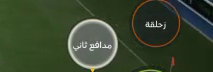

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


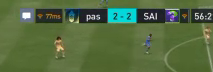

Blue Players: 3
Yellow Players: 0
---


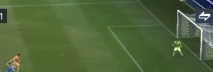

Blue Players: 2
Yellow Players: 0
---


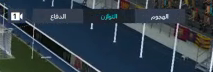

Blue Players: 5
Yellow Players: 4
---


Blue Players: 0
Yellow Players: 0
---


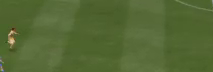

Blue Players: 1
Yellow Players: 0
---


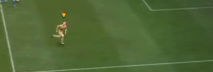

Blue Players: 0
Yellow Players: 0
---


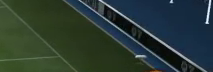

Blue Players: 3
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


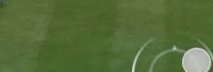

Blue Players: 0
Yellow Players: 0
---


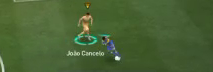

Blue Players: 1
Yellow Players: 0
---


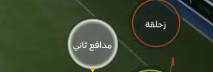

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


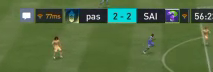

Blue Players: 3
Yellow Players: 0
---


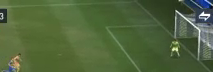

Blue Players: 3
Yellow Players: 0
---


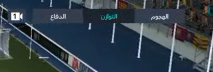

Blue Players: 3
Yellow Players: 4
---


Blue Players: 0
Yellow Players: 0
---


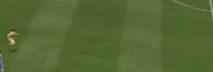

Blue Players: 1
Yellow Players: 0
---


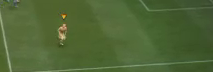

Blue Players: 0
Yellow Players: 0
---


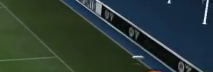

Blue Players: 1
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


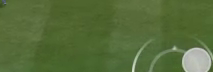

Blue Players: 0
Yellow Players: 0
---


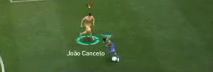

Blue Players: 1
Yellow Players: 0
---


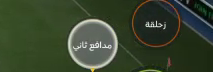

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


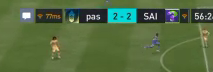

Blue Players: 3
Yellow Players: 0
---


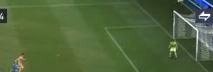

Blue Players: 3
Yellow Players: 0
---


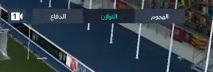

Blue Players: 7
Yellow Players: 3
---


Blue Players: 0
Yellow Players: 0
---


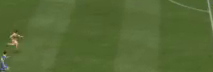

Blue Players: 0
Yellow Players: 0
---


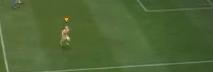

Blue Players: 0
Yellow Players: 0
---


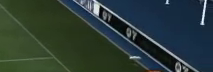

Blue Players: 3
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


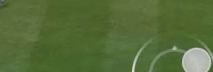

Blue Players: 1
Yellow Players: 0
---


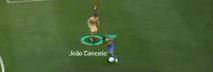

Blue Players: 1
Yellow Players: 0
---


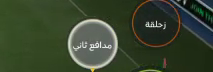

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


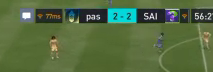

Blue Players: 3
Yellow Players: 0
---


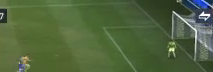

Blue Players: 3
Yellow Players: 0
---


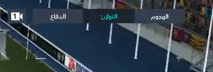

Blue Players: 6
Yellow Players: 2
---


Blue Players: 0
Yellow Players: 0
---


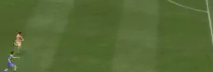

Blue Players: 1
Yellow Players: 0
---


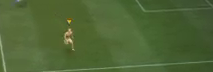

Blue Players: 0
Yellow Players: 0
---


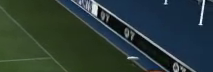

Blue Players: 2
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


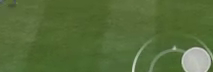

Blue Players: 0
Yellow Players: 0
---


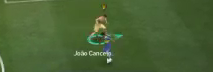

Blue Players: 1
Yellow Players: 0
---


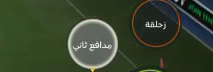

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


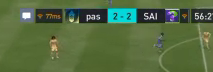

Blue Players: 3
Yellow Players: 0
---


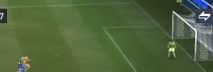

Blue Players: 3
Yellow Players: 0
---


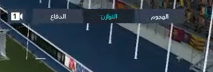

Blue Players: 6
Yellow Players: 2
---


Blue Players: 0
Yellow Players: 0
---


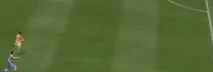

Blue Players: 1
Yellow Players: 0
---


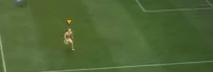

Blue Players: 0
Yellow Players: 0
---


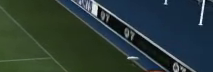

Blue Players: 2
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


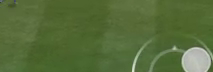

Blue Players: 0
Yellow Players: 0
---


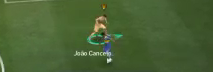

Blue Players: 1
Yellow Players: 0
---


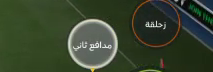

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


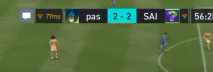

Blue Players: 3
Yellow Players: 0
---


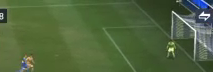

Blue Players: 2
Yellow Players: 0
---


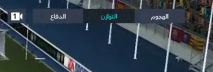

Blue Players: 6
Yellow Players: 2
---


Blue Players: 0
Yellow Players: 0
---


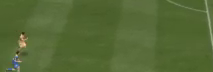

Blue Players: 1
Yellow Players: 0
---


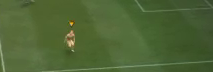

Blue Players: 0
Yellow Players: 0
---


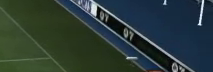

Blue Players: 2
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


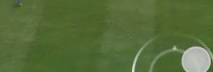

Blue Players: 0
Yellow Players: 0
---


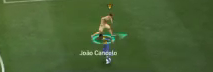

Blue Players: 1
Yellow Players: 0
---


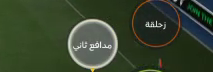

Blue Players: 0
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


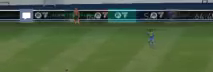

Blue Players: 1
Yellow Players: 0
---


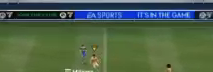

Blue Players: 7
Yellow Players: 0
---


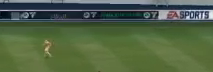

Blue Players: 0
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


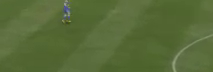

Blue Players: 1
Yellow Players: 0
---


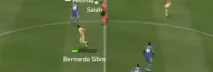

Blue Players: 2
Yellow Players: 0
---


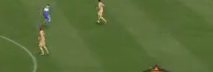

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


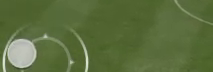

Blue Players: 0
Yellow Players: 0
---


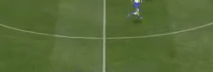

Blue Players: 1
Yellow Players: 0
---


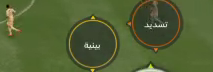

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


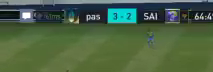

Blue Players: 3
Yellow Players: 0
---


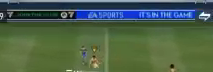

Blue Players: 7
Yellow Players: 0
---


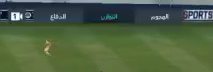

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


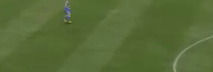

Blue Players: 1
Yellow Players: 0
---


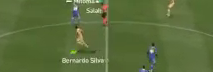

Blue Players: 2
Yellow Players: 0
---


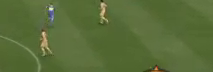

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


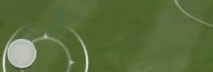

Blue Players: 0
Yellow Players: 0
---


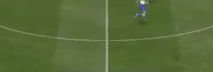

Blue Players: 1
Yellow Players: 0
---


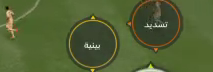

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


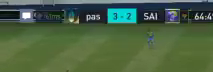

Blue Players: 3
Yellow Players: 0
---


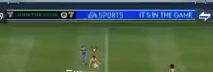

Blue Players: 7
Yellow Players: 0
---


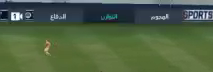

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


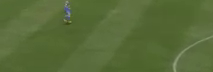

Blue Players: 1
Yellow Players: 0
---


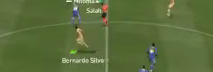

Blue Players: 2
Yellow Players: 0
---


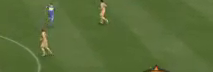

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


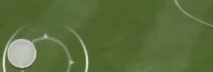

Blue Players: 0
Yellow Players: 0
---


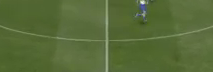

Blue Players: 1
Yellow Players: 0
---


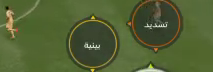

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


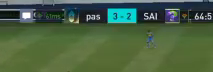

Blue Players: 4
Yellow Players: 0
---


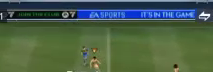

Blue Players: 7
Yellow Players: 0
---


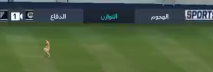

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


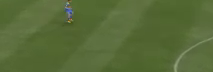

Blue Players: 1
Yellow Players: 0
---


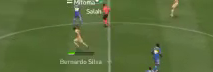

Blue Players: 2
Yellow Players: 0
---


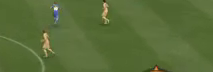

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


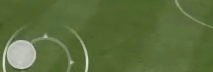

Blue Players: 0
Yellow Players: 0
---


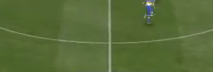

Blue Players: 1
Yellow Players: 0
---


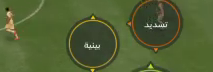

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


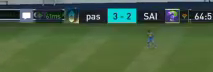

Blue Players: 4
Yellow Players: 0
---


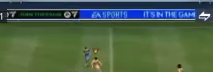

Blue Players: 7
Yellow Players: 0
---


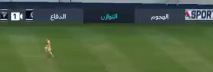

Blue Players: 1
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


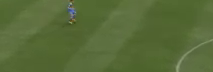

Blue Players: 1
Yellow Players: 0
---


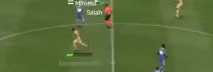

Blue Players: 2
Yellow Players: 0
---


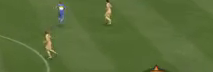

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


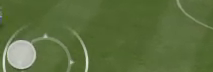

Blue Players: 0
Yellow Players: 0
---


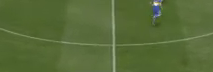

Blue Players: 1
Yellow Players: 0
---


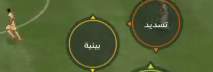

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


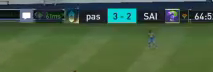

Blue Players: 4
Yellow Players: 0
---


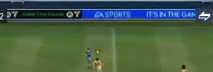

Blue Players: 7
Yellow Players: 0
---


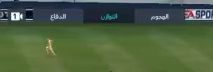

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


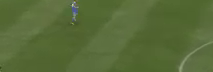

Blue Players: 1
Yellow Players: 0
---


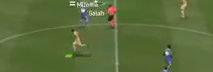

Blue Players: 2
Yellow Players: 0
---


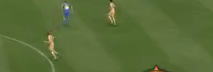

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


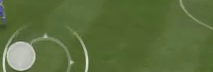

Blue Players: 1
Yellow Players: 0
---


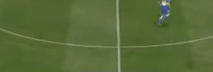

Blue Players: 1
Yellow Players: 0
---


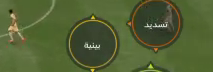

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


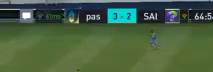

Blue Players: 4
Yellow Players: 0
---


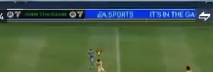

Blue Players: 8
Yellow Players: 0
---


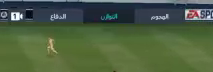

Blue Players: 1
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


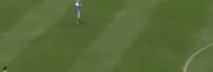

Blue Players: 1
Yellow Players: 0
---


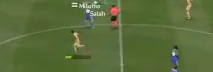

Blue Players: 2
Yellow Players: 0
---


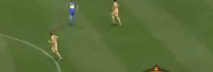

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


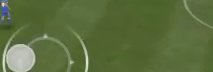

Blue Players: 1
Yellow Players: 0
---


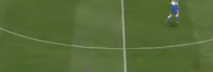

Blue Players: 1
Yellow Players: 0
---


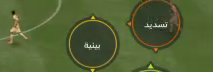

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


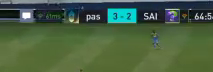

Blue Players: 4
Yellow Players: 0
---


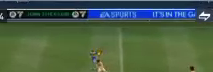

Blue Players: 7
Yellow Players: 0
---


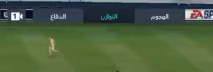

Blue Players: 1
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


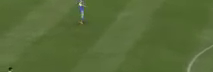

Blue Players: 1
Yellow Players: 0
---


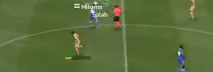

Blue Players: 2
Yellow Players: 0
---


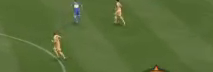

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


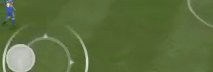

Blue Players: 1
Yellow Players: 0
---


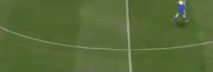

Blue Players: 1
Yellow Players: 0
---


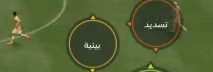

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


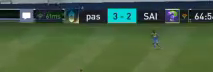

Blue Players: 4
Yellow Players: 0
---


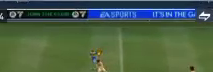

Blue Players: 7
Yellow Players: 0
---


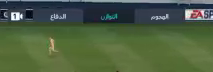

Blue Players: 1
Yellow Players: 1
---


Blue Players: 0
Yellow Players: 0
---


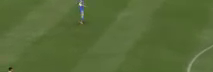

Blue Players: 1
Yellow Players: 0
---


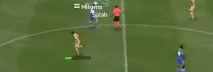

Blue Players: 2
Yellow Players: 0
---


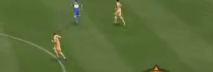

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


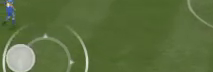

Blue Players: 1
Yellow Players: 0
---


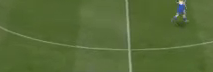

Blue Players: 1
Yellow Players: 0
---


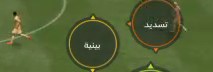

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


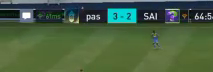

Blue Players: 1
Yellow Players: 0
---


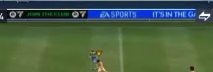

Blue Players: 7
Yellow Players: 0
---


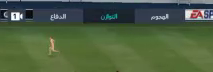

Blue Players: 3
Yellow Players: 0
---


Blue Players: 1
Yellow Players: 0
---


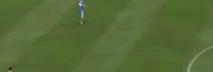

Blue Players: 1
Yellow Players: 0
---


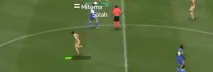

Blue Players: 2
Yellow Players: 0
---


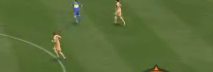

Blue Players: 1
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


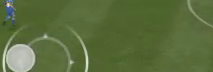

Blue Players: 1
Yellow Players: 0
---


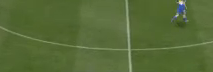

Blue Players: 1
Yellow Players: 0
---


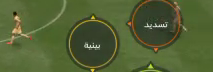

Blue Players: 0
Yellow Players: 0
---


Blue Players: 0
Yellow Players: 0
---


In [ ]:
#STEP 6

threshold_distance = 19

def detect_players(frame):
    hsv_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    yellow_range = (
          np.array([146, 112  ,58]),
          np.array([206, 172 ,118])
    )

    blue_range = (
        np.array([100, 100, 100]),
        np.array([120, 255, 255])
    )


    blue_pixels = []
    yellow_pixels = []

    for y in range(frame.shape[0]):
        for x in range(frame.shape[1]):
            pixel_color = hsv_frame[y, x]

            if blue_range[0][0] <= pixel_color[0] <= blue_range[1][0] and blue_range[0][1] <= pixel_color[1] <= blue_range[1][1] and blue_range[0][2] <= pixel_color[2] <= blue_range[1][2]:
                blue_pixels.append((x, y))

            if yellow_range[0][0] <= pixel_color[0] <= yellow_range[1][0] and yellow_range[0][1] <= pixel_color[1] <= yellow_range[1][1] and yellow_range[0][2] <= pixel_color[2] <= yellow_range[1][2]:
                yellow_pixels.append((x, y))

    blue_count = calculate_player_count(blue_pixels)
    yellow_count = calculate_player_count(yellow_pixels)

    return blue_count, yellow_count


def calculate_player_count(pixels):
    count = 0
    visited_indices = []

    for i in range(len(pixels)):
        if i not in visited_indices:
            count += 1
            visited_indices.append(i)

            for j in range(i + 1, len(pixels)):
                if abs(pixels[j][0] - pixels[i][0]) <= threshold_distance and abs(pixels[j][1] - pixels[i][1]) <= threshold_distance:
                    visited_indices.append(j)

    return count


crop_counter = 0
frames_with_blue_players = []
frames_with_yellow_players = []


for frame_counter, frame in enumerate(frames_total):
    crop_counter = 0

    width = frame.shape[1]
    height = frame.shape[0]
    crop_height = height // 4
    crop_width = width // 3

    for i in range(3):
        for j in range(4):
            x = j * crop_width
            y = i * crop_height
            crop = frame[y:y + crop_height, x:x + crop_width]

            crop_counter += 1
            blue_count, yellow_count = detect_players(crop)
            cv2_imshow(crop)
            print("Blue Players:",blue_count)
            print("Yellow Players:",yellow_count)
            print("---")

